# Exploritary Data Analysis - House Prices

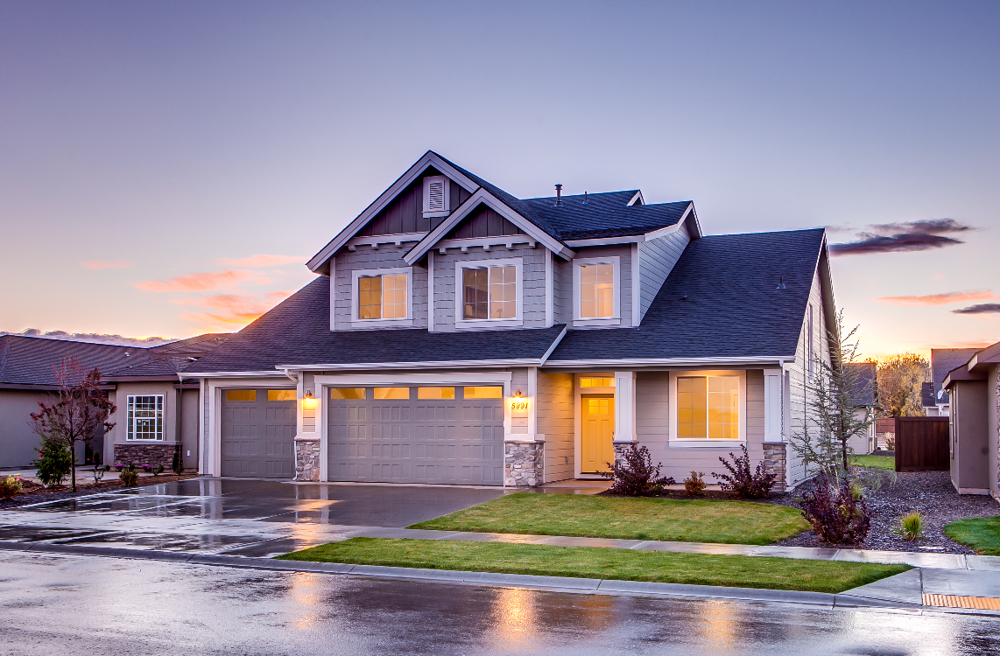

## summary

* **Problem:** Predicting Housing Prices in Ames, Iowa
* **Data:**
    * 79 Features
    * Training set has 1460 exapmles & Evaluation has 1459 examples
    * Data in CSV format
* **Framing the Problem:**
    * Supervised Learning
    * Regression
    * Evaluation Metric: Root Mean Squared Error (RMSE)


## 1. Libaries

I use my own script for all the function I use in my notebooks: EDA_Script.py

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import EDA_Script as eda


## 2. Raw Data

* Structure of the data: Tabular

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
submission_data = pd.read_csv('sample_submission.csv')

In [3]:
train.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [4]:
test.head(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


## 3. Feature Engineering

* Start with analysing the missing values and correlations. This comes in handy when to check if every feature have enough unique values to be useful for the model.
And wether we should drop those features or not.

### 3.1. Missing Values

Table and Visualization

In [5]:
eda.Overview_Missing_Values(train)

,Null Values,Percentage Null Values
PoolQC,1453,99.520548
MiscFeature,1406,96.301370
Alley,1369,93.767123
Fence,1179,80.753425
FireplaceQu,690,47.260274
LotFrontage,259,17.739726
GarageYrBlt,81,5.547945
GarageCond,81,5.547945
GarageType,81,5.547945
GarageFinish,81,5.547945


### 3.2 Correlation

In [6]:
eda.Overview_Correlation(train,'SalePrice')

,SalePrice
SalePrice,1.000000
OverallQual,0.790982
GrLivArea,0.708624
GarageCars,0.640409
GarageArea,0.623431
TotalBsmtSF,0.613581
1stFlrSF,0.605852
FullBath,0.560664
TotRmsAbvGrd,0.533723
YearBuilt,0.522897


### 3.3 Not Enough Unique Values

In [7]:
eda.Overview_Unique_Values(train,0.90)

Street consist 99.58904109589041% out of the unique value: Pave
Pave    1454
Grvl       6
Name: Street, dtype: int64
///////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////
Alley consist 3.4246575342465753% out of null values
Grvl    50
Pave    41
Name: Alley, dtype: int64
///////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////
Utilities consist 99.93150684931507% out of the unique value: NoSeWa
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
///////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////
LandSlope consist 94.65753424657535% out of the unique value: Sev
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
///////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////
Condition2 consist 98.972

Features that consist 95%-100% out of 1 unique value or a null value, is not going to affect the prediction. And can definitely be removed

In [8]:
train = train.drop(['Id','Street','Alley','Utilities','Condition2','RoofMatl','Heating','CentralAir','Electrical','LowQualFinSF','KitchenAbvGr','PoolArea','PoolQC','MiscVal'],axis=1)
test = test.drop(['Id','Street','Alley','Utilities','Condition2','RoofMatl','Heating','CentralAir','Electrical','LowQualFinSF','KitchenAbvGr','PoolArea','PoolQC','MiscVal'],axis=1)

### 3.4 Inconsistencies

In [9]:
eda.Overview_Inconsistencies(train,test,'SalePrice')

MSSubClass
Only in train[MSSubClass]: []
Only in test[MSSubClass]: [150]
----------------------------------------------------
Train - Value Counts
20     536
60     299
50     144
120     87
30      69
160     63
70      60
80      58
90      52
190     30
85      20
75      16
45      12
180     10
40       4
Name: MSSubClass, dtype: int64
----------------------------------------------------
Train - Value Counts
20     543
60     276
50     143
120     95
30      70
70      68
160     65
80      60
90      57
190     31
85      28
75       7
180      7
45       6
40       2
150      1
Name: MSSubClass, dtype: int64
----------------------------------------------------
Average Sale Price
MSSubClass
20     185224.811567
30      95829.724638
40     156125.000000
45     108591.666667
50     143302.972222
60     239948.501672
70     166772.416667
75     192437.500000
80     169736.551724
85     147810.000000
90     133541.076923
120    200779.080460
160    138647.380952
180    102300.000000

* Change the inconsistent value or column in train/test to a value or column that almost the same in train/test or use the mean.  
	* Example: 
	  ```python
	  	  # 150 doesn't exist in train, but is very close to 160
	  	  test['a'] = test['a'].replace(["150"], ["160"])
	  ```
*  If that is not possible, remove the inconsistent example out the dataset  

In [10]:
test['MSSubClass'] = test['MSSubClass'].replace([150], [160])
train['HouseStyle'] = train['HouseStyle'].replace(["2.5Fin"], ["2Story"])
train['Exterior1st'] = train['Exterior1st'].replace(["ImStucc","Stone"], ["CemntBd","CemntBd"])
train['Exterior2nd'] = train['Exterior2nd'].replace(["Other"], ["ImStucc"])
test['FullBath'] = test['FullBath'].replace(["4"], ["3"])
train['BedroomAbvGr'] = train['BedroomAbvGr'].replace(["8"], ["6"])
train['TotRmsAbvGrd'] = train['TotRmsAbvGrd'].replace(["14",'2'], ["12",'3'])
test['TotRmsAbvGrd'] = test['TotRmsAbvGrd'].replace(["13","15"], ["12","12"])
test['Fireplaces'] = test['Fireplaces'].replace(["4"], ["3"])
test['GarageCars'] = test['GarageCars'].replace(["5.0"], ["4.0"])
train['GarageQual'] = train['GarageQual'].replace(["Ex"], ["Gd"])
train['MiscFeature'] = train['MiscFeature'].replace(["TenC"], ["Gar2"])


### 3.5 Impute Missing Values

- Impute **0** or **None** when zero of something is possible  
	- Example: Some house have an garage and others don't. So impute 0 or 'No Garage'  
	-  
	  ``` python
	  	  df['a'] = df['a'].fillna(0)
	  ```
- Impute **mean** when zero of something is not possible  
	- Example: A house has always an lot area. A lot area of 0 doesn't exist.  
	-  
	  ``` python
	  	  traindf['a'] = df['a'].fillna(df['a'].mean())
	  ```

In [11]:
train['MiscFeature'] = train['MiscFeature'].fillna('No MiscFeature')
test['MiscFeature'] = test['MiscFeature'].fillna('No MiscFeature')

train['Fence'] = train['Fence'].fillna('No Fence')
test['Fence'] = test['Fence'].fillna('No Fence')

train['FireplaceQu'] = train['FireplaceQu'].fillna('No Fireplace')
test['FireplaceQu'] = test['FireplaceQu'].fillna('No Fireplace')

train['LotFrontage'] = train['LotFrontage'].fillna(train['LotFrontage'].mean())
test['LotFrontage'] = test['LotFrontage'].fillna(test['LotFrontage'].mean())

train['GarageFinish'] = train['GarageFinish'].fillna('No Garage')
test['GarageFinish'] = test['GarageFinish'].fillna('No Garage')

train['GarageYrBlt'] = train['GarageYrBlt'].fillna(0)
test['GarageYrBlt'] = test['GarageYrBlt'].fillna(0)

train['GarageCond'] = train['GarageCond'].fillna('No Garage')
test['GarageCond'] = test['GarageCond'].fillna('No Garage')

train['GarageQual'] = train['GarageQual'].fillna('No Garage')
test['GarageQual'] = test['GarageQual'].fillna('No Garage')

train['GarageType'] = train['GarageType'].fillna('No Garage')
test['GarageType'] = test['GarageType'].fillna('No Garage')

train['BsmtExposure'] = train['BsmtExposure'].fillna('No Basement')
test['BsmtExposure'] = test['BsmtExposure'].fillna('No Basement')

train['BsmtCond'] = train['BsmtCond'].fillna('No Basement')
test['BsmtCond'] = test['BsmtCond'].fillna('No Basement')

train['BsmtQual'] = train['BsmtQual'].fillna('No Basement')
test['BsmtQual'] = test['BsmtQual'].fillna('No Basement')

train['BsmtFinType2'] = train['BsmtFinType2'].fillna('No Basement')
test['BsmtFinType2'] = test['BsmtFinType2'].fillna('No Basement')

train['BsmtFinType1'] = train['BsmtFinType1'].fillna('No Basement')
test['BsmtFinType1'] = test['BsmtFinType1'].fillna('No Basement')

train['MasVnrType'] = train['MasVnrType'].fillna('None')
test['MasVnrType'] = test['MasVnrType'].fillna('None')

train['MasVnrArea'] = train['MasVnrArea'].fillna(0)
test['MasVnrArea'] = test['MasVnrArea'].fillna(0)

test['MSZoning'] = test['MSZoning'].fillna('C (all)')
test['BsmtFullBath'] = test['BsmtFullBath'].fillna(0)
test['BsmtHalfBath'] = test['BsmtHalfBath'].fillna(0)
test['Functional'] = test['Functional'].fillna('Typ')
test['GarageCars'] = test['GarageCars'].fillna(0)
test['GarageArea'] = test['GarageArea'].fillna(0)
test['KitchenQual'] = test['KitchenQual'].fillna('TA')
test['SaleType'] = test['SaleType'].fillna('WD')
test['Exterior1st'] = test['Exterior1st'].fillna('VinylSd')
test['Exterior2nd'] = test['Exterior2nd'].fillna('VinylSd')
test['BsmtFinSF1'] = test['BsmtFinSF1'].fillna(0)
test['BsmtFinSF2'] = test['BsmtFinSF2'].fillna(0)
test['BsmtUnfSF'] = test['BsmtUnfSF'].fillna(0)
test['TotalBsmtSF'] = test['TotalBsmtSF'].fillna(0)

In [12]:
eda.Overview_Missing_Values(train)
eda.Overview_Missing_Values(test)

,Null Values,Percentage Null Values


Look how beautiful the heatmap is now

### 3.6 Fix Outliers

* Check which features are numerical

In [13]:
train_num = train.select_dtypes(exclude=['object'])
print(train_num.columns)

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')


- **First** Plot the numerical feature against the target  
	- 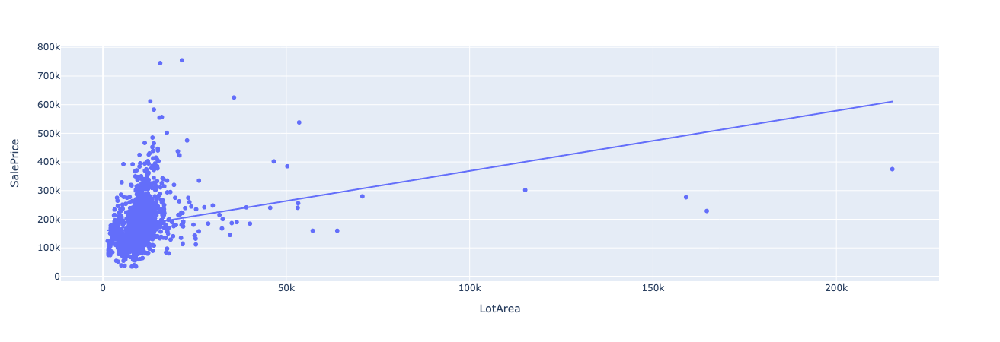
- **Second** Change all outliers greater than x number and set them equal to x number In the example of LotArea,we set all the outliers greater than 45000 equal to 4500  
	- Change x so that the  
	-  
	  ``` python
	  	  df.loc[df.LotArea > 45000,'Year'] = 45000
	  ```
- **Thrid** Plot the feature against the target again and see if it improved  
	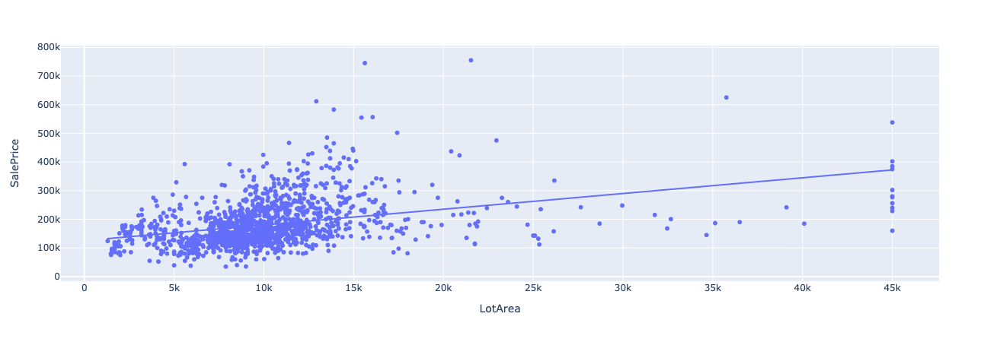 
- **Fourth** Check in the increase of correlation after the changing the outliers  
	```python
	  	  Before: 0.2638433538714056
	  	  After: 0.3776970308708181
	  	  Difference: 43.151997322965926%
	```
- **Fifth** The increase in correlation will increase overfitting, so use regularisations in your ML models to prevent overfitting.  
- **Model Performance**  
	- Check if changing the boundary for outliers have any impact on improving the performance of the model. Because in the real world outliers exist, so removing outliers is not always the solution  

In [14]:
eda.Check_Outliers(train, 'SalePrice','LotArea',45000, 'greater')

Before: 0.2638433538714056
After: 0.3776970308708181
Difference: 43.151997322965926%


In [15]:
train.loc[train.LotFrontage > 150,'LotFrontage'] = 150
test.loc[test.LotFrontage > 150,'LotFrontage'] = 150

train.loc[train.LotArea > 45000,'LotArea'] = 45000
test.loc[test.LotArea > 45000,'LotArea'] = 45000

train.loc[train.YearBuilt < 1900,'YearBuilt'] = 1900
test.loc[test.YearBuilt < 1900,'YearBuilt'] = 1900

train.loc[train.MasVnrArea > 900,'MasVnrArea'] = 900
test.loc[test.MasVnrArea > 900,'MasVnrArea'] = 900

train.loc[train.BsmtFinSF1 > 1700,'BsmtFinSF1'] = 1700
test.loc[test.BsmtFinSF1 > 1700,'BsmtFinSF1'] = 1700

train.loc[train.TotalBsmtSF > 2500,'TotalBsmtSF'] = 2500
test.loc[test.TotalBsmtSF > 2500,'TotalBsmtSF'] = 2500

train.loc[train['1stFlrSF'] > 2500,'1stFlrSF'] = 2500
test.loc[test['1stFlrSF'] > 2500,'1stFlrSF'] = 2500

train.loc[train.GrLivArea > 3750,'GrLivArea'] = 3750
test.loc[test.GrLivArea > 3750,'GrLivArea'] = 3750

train.loc[train.BsmtFullBath > 2,'BsmtFullBath'] = 2
test.loc[test.BsmtFullBath > 2,'BsmtFullBath'] = 2

train.loc[train.BedroomAbvGr > 6,'BedroomAbvGr'] = 6
test.loc[test.BedroomAbvGr > 6,'BedroomAbvGr'] = 6

train.loc[train.TotRmsAbvGrd > 12,'TotRmsAbvGrd'] = 12
test.loc[test.TotRmsAbvGrd > 12,'TotRmsAbvGrd'] = 12

train.loc[train.Fireplaces > 2,'Fireplaces'] = 2
test.loc[test.Fireplaces > 2,'Fireplaces'] = 2

train.loc[train.GarageYrBlt < 1900,'GarageYrBlt'] = 1900
test.loc[test.GarageYrBlt < 1900,'GarageYrBlt'] = 1900

train.loc[train.GarageCars > 3,'GarageCars'] = 3
test.loc[test.GarageCars > 3,'GarageCars'] = 3

train.loc[train.GarageArea > 1150,'GarageArea'] = 1150
test.loc[test.GarageArea > 1150,'GarageArea'] = 1150

train.loc[train.WoodDeckSF > 500,'WoodDeckSF'] = 500
test.loc[test.WoodDeckSF > 500,'WoodDeckSF'] = 500

train.loc[train.OpenPorchSF > 300,'OpenPorchSF'] = 300
test.loc[test.OpenPorchSF > 300,'OpenPorchSF'] = 300

train.loc[train.EnclosedPorch > 300,'EnclosedPorch'] = 300
test.loc[test.EnclosedPorch > 300,'EnclosedPorch'] = 300


### 3.7 Feature Extraction

- Changing DataType  
	- Check if correlation didn't change  
- Changing Values  
	- Check if correlation didn't change  
	- Examples:  
		- Year to age. Age is a continuous value that can provide more information about the data than year of an event  
- Combining Features  
	- Check if correlation didn't change  
	-  
	  ``` python
	  	  train['Bedrooms'] = train['Bedroom1'] + train['Bedroom2'] + train['Bedroom3']
	  ```

* Changing Values

In [16]:
# Total amount of baths in the house
train['TotalBath'] = train['BsmtFullBath'] + train['BsmtHalfBath']*0.5 + train['FullBath'] + train['HalfBath']*0.5
test['TotalBath'] = test['BsmtFullBath'] + test['BsmtHalfBath']*0.5 + test['FullBath'] + test['HalfBath']*0.5

# Total square feet of porch
train['TotalPorchSF'] = train['OpenPorchSF'] + train['EnclosedPorch'] + train['3SsnPorch'] + train['ScreenPorch']
test['TotalPorchSF'] = test['OpenPorchSF'] + test['EnclosedPorch'] + test['3SsnPorch'] + test['ScreenPorch']

# Total square feet of house
train['TotalSF'] = train['TotalBsmtSF'] + train['1stFlrSF'] + train['2ndFlrSF']
test['TotalSF'] = test['TotalBsmtSF'] + test['1stFlrSF'] + test['2ndFlrSF']

# Convert year to age
# Use 2010 as the year of sale, because Yrsold doens't go beyond 2010
train['Age'] = 2010 - train['YearBuilt']
test['Age'] = 2010 - test['YearBuilt']

train['RemodAfter'] = train['YearRemodAdd'] - train['YearBuilt']
test['RemodAfter'] = test['YearRemodAdd'] - test['YearBuilt']
test.loc[test.RemodAfter<0,'RemodAfter'] = 0

train['AgeRemod'] = 2010 - train['YearRemodAdd']
test['AgeRemod'] = 2010 - test['YearRemodAdd']

train['AgeSold'] = 2010 - train['YrSold']
test['AgeSold'] = 2010 - test['YrSold']

train['AgeSoldBefore'] = train['YrSold'] - train['YearBuilt']
test['AgeSoldBefore'] = test['YrSold'] - test['YearBuilt']

train['Age_Garage'] = 2010 - train['GarageYrBlt']
test['Age_Garage'] = 2010 - test['GarageYrBlt']
train['Age_Garage_Sold'] = train["YrSold"] - train['GarageYrBlt']
test['Age_Garage_Sold'] = test["YrSold"] - test['GarageYrBlt']


* Changing Data Types

In [17]:
train['MSSubClass'] = train['MSSubClass'].astype(str)
test['MSSubClass'] = test['MSSubClass'].astype(str)

### 3.8 Ordinal Categories

* Check if the values in categorical features are in a ranking order

In [18]:
eda.Overview_Categories(train)

,Feature,Categories,Number
0,MSSubClass,"[60, 20, 70, 50, 190, 45, 90, 120, 30, 85, 80,...",15
1,MSZoning,"[RL, RM, C (all), FV, RH]",5
2,LotShape,"[Reg, IR1, IR2, IR3]",4
3,LandContour,"[Lvl, Bnk, Low, HLS]",4
4,LotConfig,"[Inside, FR2, Corner, CulDSac, FR3]",5
5,LandSlope,"[Gtl, Mod, Sev]",3
6,Neighborhood,"[CollgCr, Veenker, Crawfor, NoRidge, Mitchel, ...",25
7,Condition1,"[Norm, Feedr, PosN, Artery, RRAe, RRNn, RRAn, ...",9
8,BldgType,"[1Fam, 2fmCon, Duplex, TwnhsE, Twnhs]",5
9,HouseStyle,"[2Story, 1Story, 1.5Fin, 1.5Unf, SFoyer, SLvl,...",7


In [19]:
ordinal_categories = ['HouseStyle','ExterQual','ExterCond','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2','HeatingQC','KitchenQual','FireplaceQu','GarageFinish','GarageQual','GarageCond']


In [20]:
y = train.pop('SalePrice')
y = np.log1p(y)

## 4. Transformation

In [21]:
print('Train Shape: '+str(train.shape))
print('Test Shape: '+str(test.shape))

Train Shape: (1460, 76)
Test Shape: (1459, 76)


* Convert Categorical Data into One-Hot Encoding

In [22]:
train = pd.get_dummies(train)
test = pd.get_dummies(test)

* Check for inconsistencies between columns

In [23]:
print("\nOnly in Train: "+ str(list(set(train.columns) - set(test.columns))))
print("Only in Test: "+ str(list(set(test.columns) - set(train.columns))))


Only in Train: []
Only in Test: []


- Skewness  
	- If the skewness is between -0.5 and 0.5, the data are fairly symmetrical.  
	- If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed.  
	- If the skewness is less than -1 or greater than 1, the data are highly skewed.  

In [24]:
eda.Check_Skewness(train)

,Skew
Exterior2nd_CBlock,38.209946
Exterior1st_CBlock,38.209946
Exterior1st_AsphShn,38.209946
HeatingQC_Po,38.209946
Functional_Sev,38.209946
ExterCond_Po,38.209946
Exterior1st_BrkComm,26.990701
GarageCond_Ex,26.990701
SaleType_Con,26.990701
MiscFeature_Othr,26.990701


* Log Transformation

In [25]:
train_skew,test_skew = eda.Log_Transform(train,test,'SalePrice', 1)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning:

invalid value encountered in log1p

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/pandas/core/arraylike.py:402: RuntimeWarning:

divide by zero encountered in log1p



In [26]:
eda.Check_Skewness(train_skew)

,Skew
Exterior1st_CBlock,38.218750
HeatingQC_Po,38.218750
Functional_Sev,38.218750
Exterior2nd_CBlock,38.218750
Exterior1st_AsphShn,38.218750
ExterCond_Po,38.218750
Neighborhood_Blueste,26.984375
GarageCond_Ex,26.984375
SaleType_Con,26.984375
Exterior1st_BrkComm,26.984375


In [27]:
eda.Check_INF_values(train_skew)

Done


In [28]:
eda.Check_INF_values(test_skew)

AgeSoldBefore
Age_Garage_Sold
Done


In [29]:
test_skew = test_skew.replace([np.inf, -np.inf], [0,0])
eda.Check_INF_values(test_skew)

Done


In [30]:
eda.Overview_Missing_Values(test_skew)

,Null Values,Percentage Null Values
Age_Garage,1,0.06854
Age_Garage_Sold,1,0.06854


In [31]:
test_skew = test_skew.fillna(0)

# 5. Training Models

In [32]:
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error
from scipy.stats import skew

from sklearn.linear_model import Ridge, ElasticNet,  Lasso, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from catboost import CatBoostRegressor
import xgboost as xg

* Splitting the data into training and test sets

In [33]:
from sklearn.model_selection import train_test_split
X = train_skew.copy()
y_log = y.copy()
X_train, X_cv, y_train, y_cv = train_test_split(X, y_log, test_size=0.3, random_state=42)

* Lasso Regression hyperparameter tuning: alpha

In [34]:
eda.hypertuning(X_train, y_train, X_cv, y_cv, Lasso, 'alpha', {'random_state':0},0.00005, 0.001)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.752e+00, tolerance: 1.584e-02

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.663e-02, tolerance: 1.584e-02

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:634: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Du

Minimum CV MSE is 0.01372538322629416 at alpha = 0.00025000001
Minimum difference between CV and Train MSE is 0.0020304822960752877 at alpha = 0.0004500000100000001


* Ridge Regression hyperparameter tuning: alpha

In [35]:
eda.hypertuning(X_train, y_train, X_cv, y_cv, Ridge, 'alpha', {'random_state':0},0.1,10)

Minimum CV MSE is 0.015201763121459771 at alpha = 3.500000000010002
Minimum difference between CV and Train MSE is 0.0037899770127202467 at alpha = 9.900000000009982


* CatBooster hyperparameter tuning: n_estimators

In [36]:
eda.hypertuning(X_train, y_train, X_cv, y_cv, CatBoostRegressor, 'learning_rate', {'random_state':0,'verbose':0},0.0005,0.01,0.0005)

Minimum CV MSE is 0.014437433062339609 at alpha = 0.009500000000000005
Minimum difference between CV and Train MSE is 0.00480835582077602 at alpha = 0.0025


* CatBooster hyperparameter tuning: n_estimators

In [37]:
eda.hypertuning(X_train, y_train, X_cv, y_cv, CatBoostRegressor, 'n_estimators', {'learning_rate':0.005,'random_state':0,'verbose':0},100,2000,1)

Minimum CV MSE is 0.014643507588528016 at alpha = 1901
Minimum difference between CV and Train MSE is 0.004610216782815573 at alpha = 501


* XGBoost hyperparameter tuning: learning_rate

In [38]:
eda.hypertuning(X_train, y_train, X_cv, y_cv, xg.XGBRegressor, 'learning_rate', {'random_state':0,'verbose':0},0.005,0.25,0.005)

[11:27:40] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:27:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:27:41] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:27:42] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:27:42] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:27:43] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-c

Minimum CV MSE is 0.01611987905377865 at alpha = 0.09500000000000001
Minimum difference between CV and Train MSE is -0.1725774142208394 at alpha = 0.005


* XGBoost hyperparameter tuning: n_estimators

In [39]:
eda.hypertuning(X_train, y_train, X_cv, y_cv, xg.XGBRegressor, 'n_estimators', {'learning_rate':0.05,'random_state':0,'verbose':0},50,2500, 750)

[11:28:18] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:28:25] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:28:32] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:28:39] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:28:46] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "verbose" } are not used.

[11:28:54] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-c

Minimum CV MSE is 0.016442817588172887 at alpha = 750
Minimum difference between CV and Train MSE is 0.016414447714198692 at alpha = 750


In [40]:
#Combine 4 models (2 tree-based AND 2 linear Models) 
def make_submission(X_train, y_train, X_test):    
    sub_df = pd.read_csv('sample_submission.csv', index_col = "Id")
    # hyperparameter tuning for ridge regression worked!
    ridge = Ridge(alpha = 0.949).fit(X_train,y_train)
    ridge_preds_log=ridge.predict(X_test)
    # hyperparameter tuning for lasso regression worked!
    lasso = Lasso(alpha = 0.000451).fit(X_train,y_train)
    lasso_preds_log=lasso.predict(X_test)
    #tuned learning_rate = 0.005 and n_estimators = 1000 but did not improve the score. So used this set of parameters of someone else
    catB = CatBoostRegressor(random_state=0,verbose=0).fit(X_train,y_train)
    catB_preds_log=catB.predict(X_test)
    # tuned learning_rate = 0.05 and n_estimators = 1200 but did improve the score. So used this set of parameters of someone else
    xgb = xg.XGBRegressor(learning_rate=0.01,n_estimators=2000, subsample=0.7,colsample_bytree=0.7,random_state=0).fit(X_train,y_train)
    xgb_preds_log=xgb.predict(X_test)
    
    catb_xbr_lasso_ridge_mean_preds_log=(ridge_preds_log+lasso_preds_log+catB_preds_log+xgb_preds_log)/4
    sub_df['SalePrice'] = np.exp(catb_xbr_lasso_ridge_mean_preds_log)-1
    sub_df.to_csv("submission.csv")
    
make_submission(train_skew,y,test_skew)    